In [1]:
import numpy as np
import pandas as pd
import os
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import random
#Text Color
from termcolor import colored

#NLP
from sklearn.feature_extraction.text import CountVectorizer

#WordCloud
from wordcloud import WordCloud, STOPWORDS

#Text Processing
import re
import nltk

In [67]:
train = pd.read_csv('../input/shopee-product-matching/train.csv')
test = pd.read_csv('../input/shopee-product-matching/test.csv')
sample = pd.read_csv('../input/shopee-product-matching/sample_submission.csv')

In [4]:
print("Number of images in train dataset:",len(train))
print("Number of images in test dataset:",len(test))

Number of images in train dataset: 34250
Number of images in test dataset: 3


In [14]:
#Image Folder Paths
train_jpg_directory = '../input/shopee-product-matching/train_images'
test_jpg_directory = '../input/shopee-product-matching/test_images'

In [15]:
def getImagePaths(path):
    """
    Function to Combine Directory Path with individual Image Paths
    
    parameters: path(string) - Path of directory
    returns: image_names(string) - Full Image Path
    """
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

In [16]:
#Get complete image paths for train and test datasets
train_images_path = getImagePaths(train_jpg_directory)
test_images_path = getImagePaths(test_jpg_directory)

In [18]:
test_images_path

['../input/shopee-product-matching/test_images/0006c8e5462ae52167402bac1c2e916e.jpg',
 '../input/shopee-product-matching/test_images/0008377d3662e83ef44e1881af38b879.jpg',
 '../input/shopee-product-matching/test_images/0007585c4d0f932859339129f709bfdc.jpg']

In [7]:
train.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


In [8]:
test.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


In [9]:
#Checking missing data
train.isnull().sum()

posting_id     0
image          0
image_phash    0
title          0
label_group    0
dtype: int64

In [10]:
len(train)

34250

In [11]:
#Column-wise unique values
for col in train.columns:
    print(col + ":" + colored(str(len(train[col].unique()))))

posting_id:34250
image:32412
image_phash:28735
title:33117
label_group:11014


In [62]:
# Function to display images:
def display_multiple_img(images_paths, rows, cols):
    """
    Function to Display Images from Dataset.
    
    parameters: images_path(string) - Paths of Images to be displayed
                rows(int) - No. of Rows in Output
                cols(int) - No. of Columns in Output
    """
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()



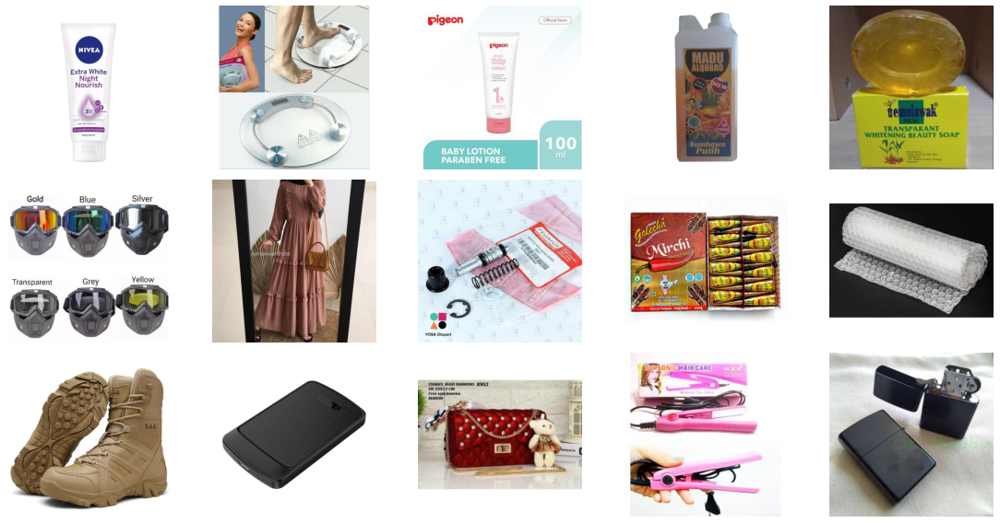

In [19]:
display_multiple_img(train_images_path[10:30], 3,5)


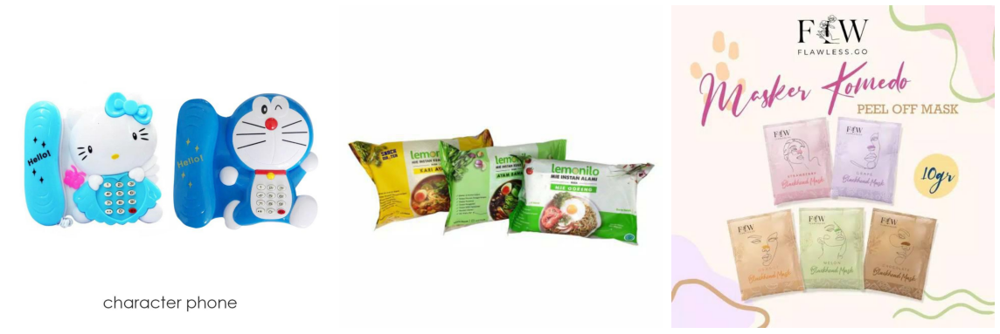

In [20]:
display_multiple_img(test_images_path, 1, 3)

In [24]:
top10 = pd.DataFrame(train.label_group.value_counts().head(10))
top10.reset_index(inplace=True)
top10.columns = ['label_group','count']
top10

,label_group,count
0,994676122,51
1,1163569239,51
2,1141798720,51
3,159351600,51
4,562358068,51
5,3113678103,51
6,3627744656,51
7,3206118280,49
8,1733221456,46
9,1166650192,46


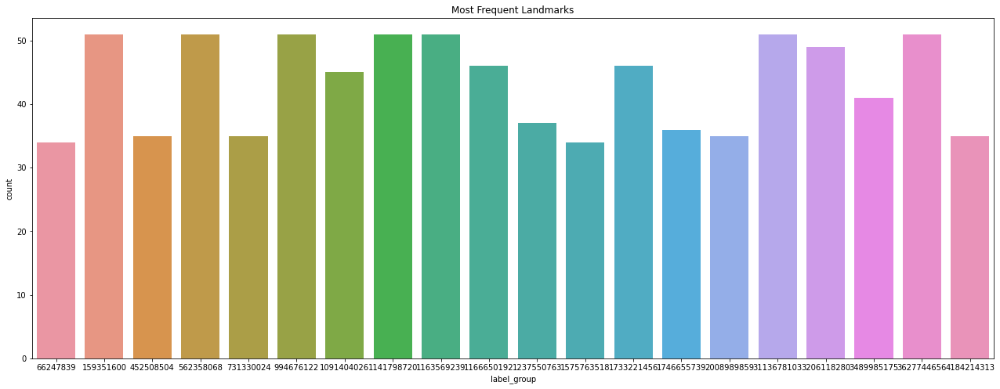

In [32]:
# Plot the most frequent landmark_ids
top20 = pd.DataFrame(train.label_group.value_counts().head(20))
top20.reset_index(inplace=True)
top20.columns = ['label_group','count']
top20
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize = (22, 8))
plt.title('Most Frequent Landmarks')
sns.set_color_codes("muted")
sns.barplot(x="label_group", y="count", data=top20, label="Count")
plt.show()

In [31]:
bot10 = pd.DataFrame(train.label_group.value_counts().tail(10))
bot10.reset_index(inplace=True)
bot10.columns = ['label_group','count']
bot10

,label_group,count
0,1395102007,2
1,3907914144,2
2,257292447,2
3,406412315,2
4,2547455009,2
5,1349674444,2
6,2359590024,2
7,1528129430,2
8,3156068330,2
9,53836859,2


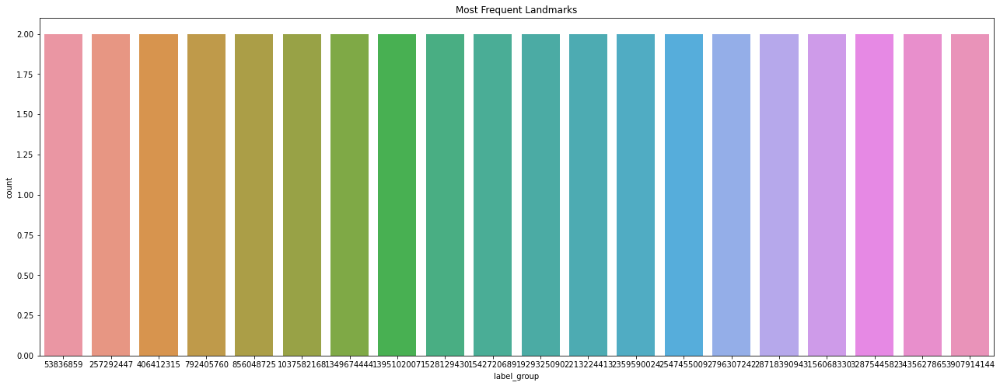

In [39]:
# Plot the least frequent products
bot20 = pd.DataFrame(train.label_group.value_counts().tail(20))
bot20.reset_index(inplace=True)
bot20.columns = ['label_group','count']

import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize = (22, 8))
plt.title('Most Frequent Landmarks')
sns.set_color_codes("muted")
sns.barplot(x="label_group", y="count", data=bot20, label="Count")
plt.show()

In [34]:
#Number of products with more than 10 images:
counts = train['label_group'].value_counts().sort_values(ascending=False)
above10 = counts[counts >10].index.shape[0]
above10

233

In [35]:
#Number of lproducts with more than 20 images:
counts = train['label_group'].value_counts().sort_values(ascending=False)
above10 = counts[counts >20].index.shape[0]
above10

52

[Text(0.5, 0, 'Products'), Text(0, 0.5, 'Number of images')]

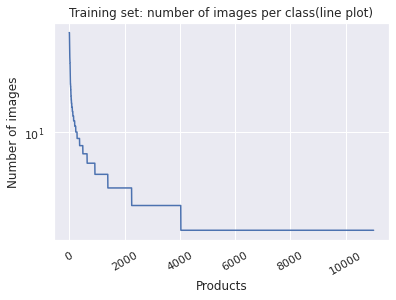

In [53]:
sns.set()
plt.title('Training set: number of images per class(line plot)')
landmarks_fold = pd.DataFrame(train['label_group'].value_counts())
landmarks_fold.reset_index(inplace=True)
landmarks_fold.columns = ['landmark_id','count']
ax = landmarks_fold['count'].plot(logy=True, grid=True)
locs, labels = plt.xticks()
plt.setp(labels, rotation=30)
ax.set(xlabel="Products", ylabel="Number of images")

In [68]:
#Adding file paths to train and test datasets:
def get_train_file_path(image_id):
    return "../input/shopee-product-matching/train_images/{}".format(image_id)
train['file_path'] = train['image'].apply(get_train_file_path)


def get_test_file_path(image_id):
    return "../input/shopee-product-matching/test_images/{}".format(image_id)
test['file_path'] = test['image'].apply(get_train_file_path)

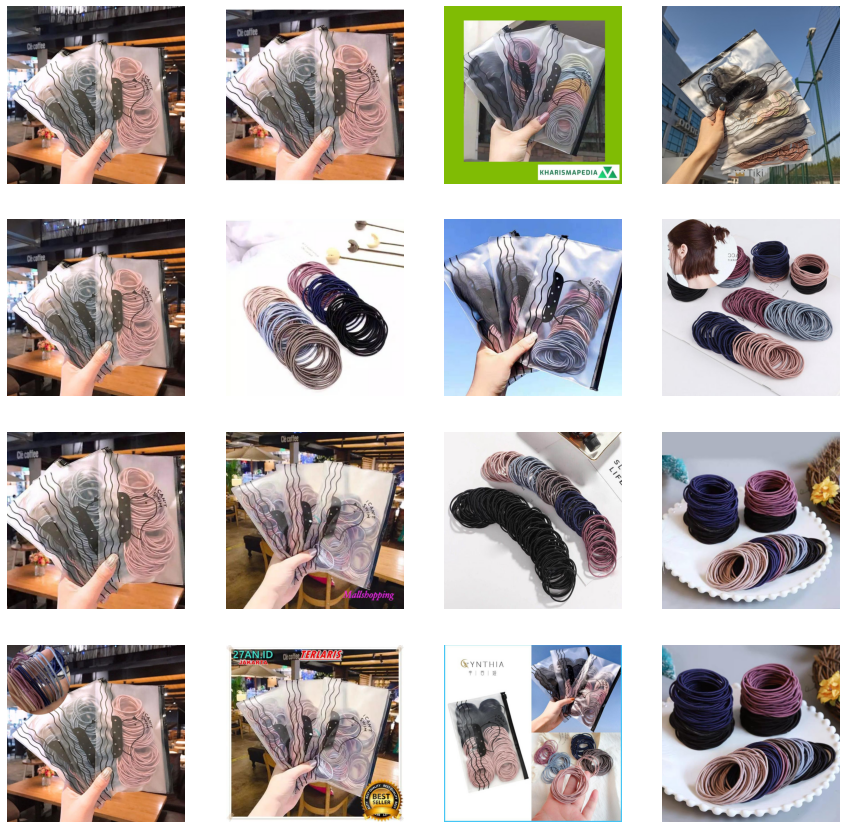

In [45]:
#Lets examine product with label_group is 994676122 which is having highest count :
import os
import glob
import cv2
train1 = train[train.label_group==994676122]
fig = plt.figure(figsize=(15,15))
x=1
for i in train1.file_path[:16]:
    image = cv2.imread(i)
    fig.add_subplot(4, 4, x)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    x+=1

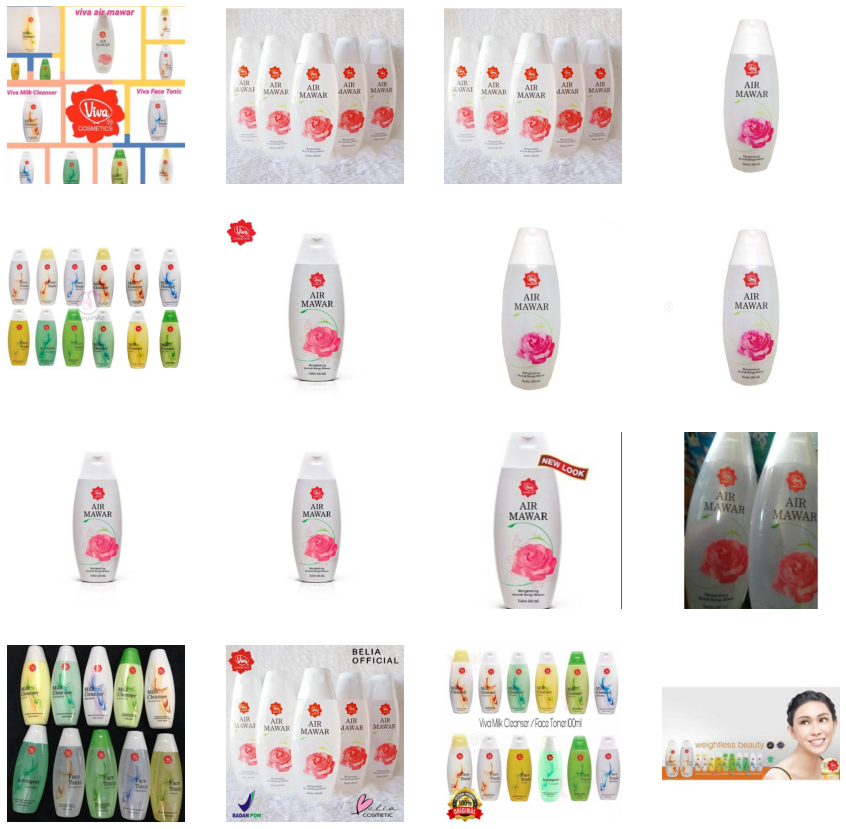

In [46]:
train2 = train[train.label_group==562358068]
fig = plt.figure(figsize=(15,15))
x=1
for i in train2.file_path[:16]:
    image = cv2.imread(i)
    fig.add_subplot(4, 4, x)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    x+=1

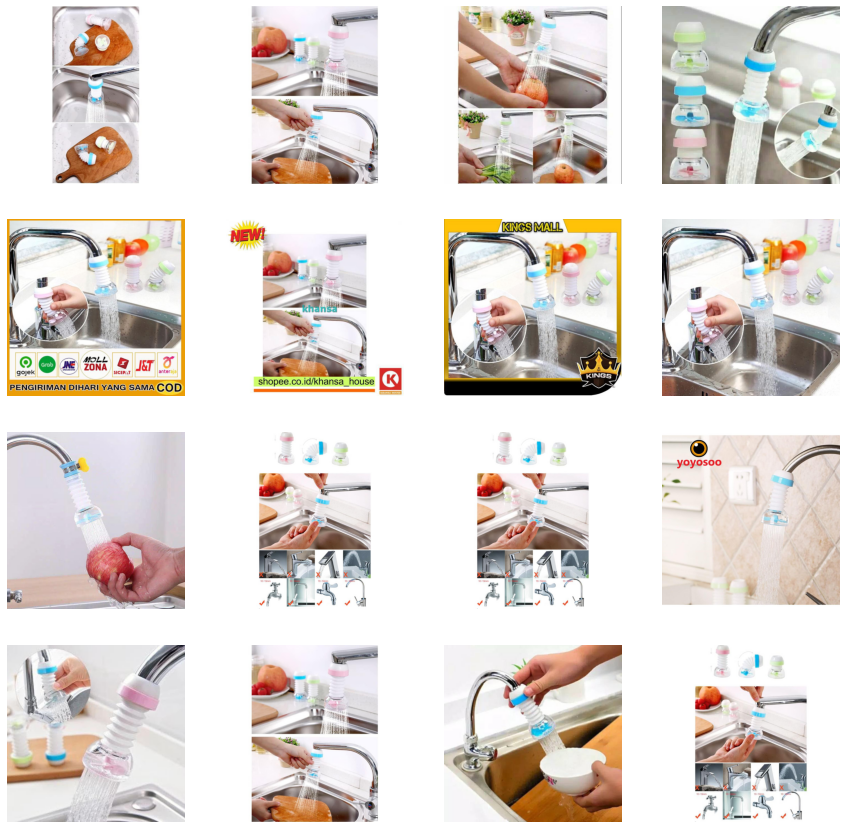

In [47]:
train3 = train[train.label_group==3113678103]
fig = plt.figure(figsize=(15,15))
x=1
for i in train3.file_path[:16]:
    image = cv2.imread(i)
    fig.add_subplot(4, 4, x)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    x+=1

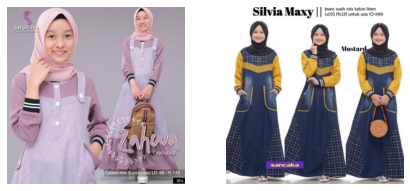

In [48]:

train4 = train[train.label_group==1395102007]
fig = plt.figure(figsize=(15,15))
x=1
for i in train4.file_path[:16]:
    image = cv2.imread(i)
    fig.add_subplot(4, 4, x)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    x+=1

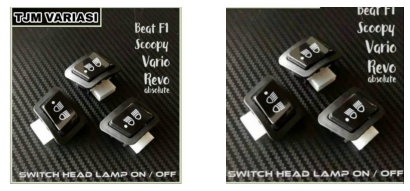

In [49]:

train4 = train[train.label_group==3907914144]
fig = plt.figure(figsize=(15,15))
x=1
for i in train4.file_path[:16]:
    image = cv2.imread(i)
    fig.add_subplot(4, 4, x)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    x+=1

In [71]:
#Exploring titles:
print(train.shape)
print(train['title'].nunique())

(34250, 6)
33117


In [72]:
t = train['title'].value_counts().sort_values(ascending=False).reset_index()
t.columns = ['title','count']
t

,title,count
0,Koko syubbanul muslimin koko azzahir koko baju,9
1,Baju Koko Pria Gus Azmi Syubbanul Muslimin Kom...,8
2,Viva Air Mawar,6
3,Monde Boromon Cookies 1 tahun+ 120gr,6
4,100 Pcs Ikat Rambut Karet Polos Elastis Gaya K...,6
...,...,...
33112,HelloMaster - 665 - Tas Handbag Wanita KOREA F...,1
33113,"Holder Hp , Mobil & Rumah Magic Suction 360 D...",1
33114,KARDUS PACKING,1
33115,SANDAL WEDGES SPON KN 02 SILANG,1


In [78]:
t. loc[t['count'] >1]

,title,count
0,Koko syubbanul muslimin koko azzahir koko baju,9
1,Baju Koko Pria Gus Azmi Syubbanul Muslimin Kom...,8
2,Viva Air Mawar,6
3,Monde Boromon Cookies 1 tahun+ 120gr,6
4,100 Pcs Ikat Rambut Karet Polos Elastis Gaya K...,6
...,...,...
957,Wardah Renew You Anti Aging Facial Wash 100ml,2
958,Obeng set toolkit 31in1 / obeng service mini 3...,2
959,Purbasari Hand Gel 50ml,2
960,Inez Satin Smooth Liquid Foundation,2


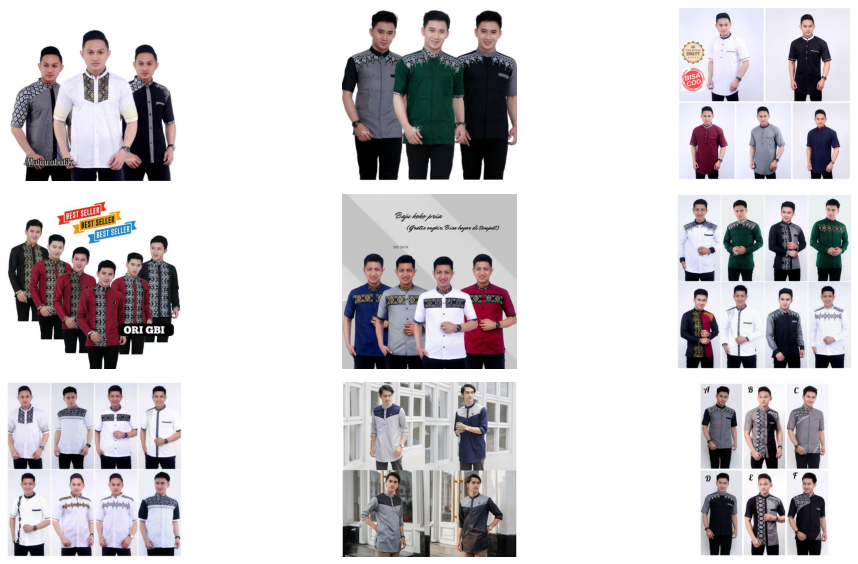

In [94]:
#Display images for First title = "Koko syubbanul muslimin koko azzahir koko baju"
path=train.loc[train["title"] == "Koko syubbanul muslimin koko azzahir koko baju","file_path"]
display_multiple_img(path,3,3)

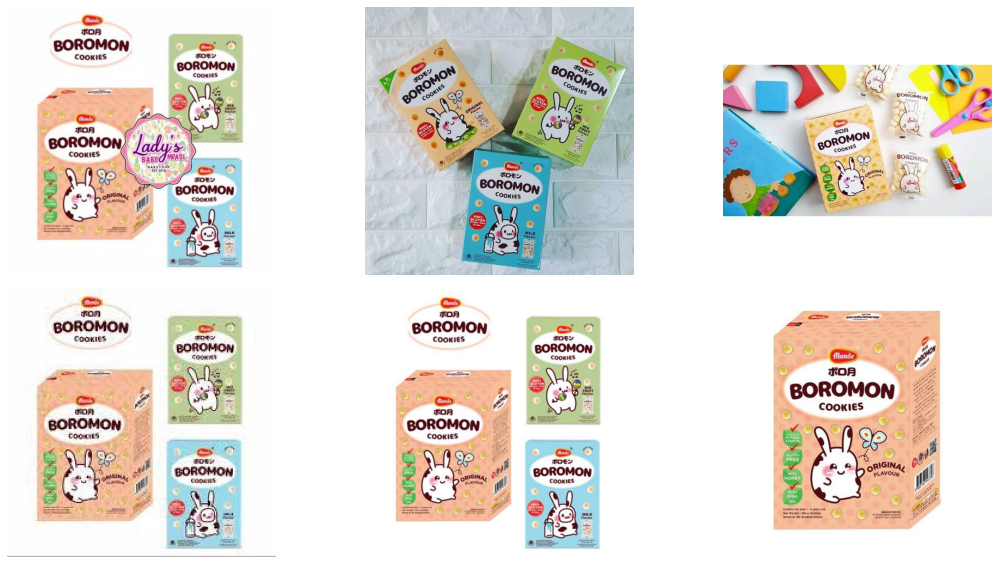

In [98]:
#Monde Boromon Cookies 1 tahun+ 120gr
path=train.loc[train["title"] == "Monde Boromon Cookies 1 tahun+ 120gr","file_path"]
display_multiple_img(path,2,3)

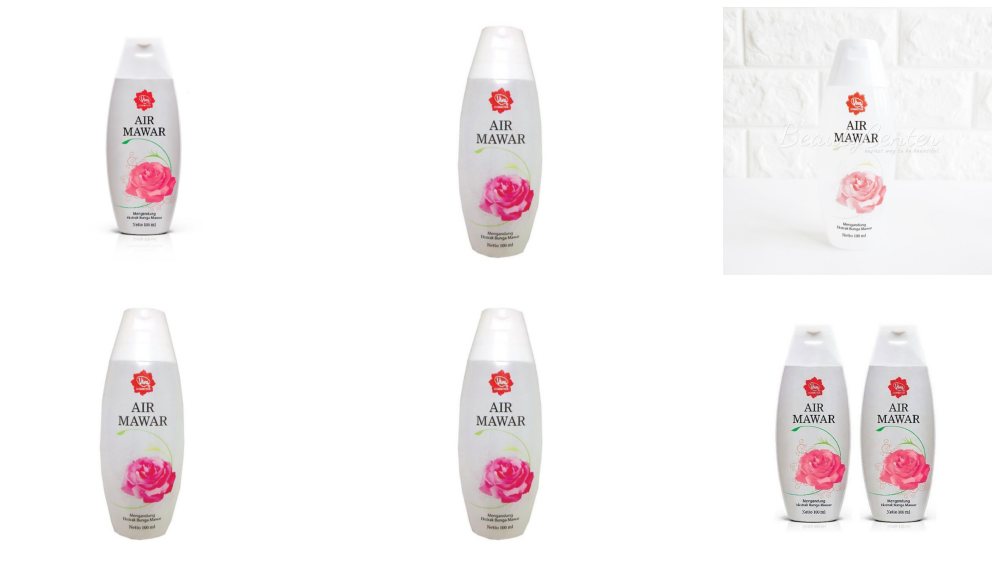

In [97]:
#Viva Air Mawar
path=train.loc[train["title"] == "Viva Air Mawar","file_path"]
display_multiple_img(path,2,3)

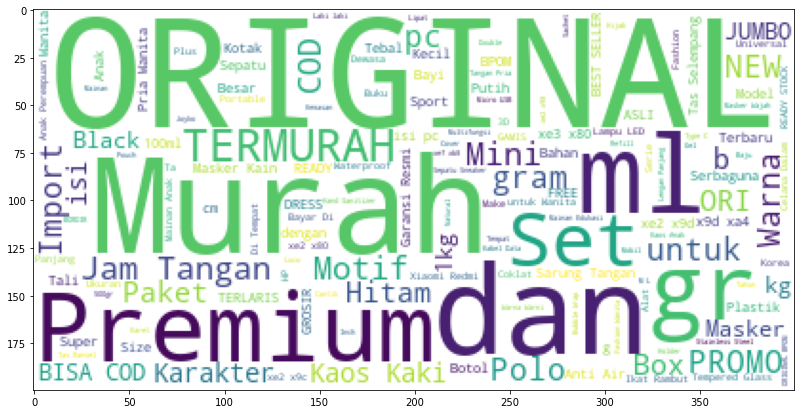

In [51]:
#wordcloud
wc = WordCloud(
    background_color='white',
    max_words = 150,
    random_state = 42,
    max_font_size=80
    )
wc.generate(' '.join(train["title"]))
plt.figure(figsize=(50,7))
plt.imshow(wc)
plt.show()

In [64]:
train.head()

,posting_id,image,image_phash,title,label_group,file_path
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,../input/shopee-product-matching/train_images/...
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045,../input/shopee-product-matching/train_images/...
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,../input/shopee-product-matching/train_images/...
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,../input/shopee-product-matching/train_images/...
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,../input/shopee-product-matching/train_images/...


In [99]:
#First we will work on labels i.e title
#From the fouth row we can see that the tile is not in english, on investigating it has been found that is in 
#Indonesian langauge

stopwords = nltk.corpus.stopwords.words('english')
stopwords1 = nltk.corpus.stopwords.words('indonesian')

In [100]:
def remove_stopwords(text):
    text1=" ".join([word for word in str(text).split() if word not in stopwords])
    return " ".join([word for word in str(text1).split() if word not in stopwords])
train["title"] = train["title"].apply(lambda text: remove_stopwords(text))
train.head()

,posting_id,image,image_phash,title,label_group,file_path
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,../input/shopee-product-matching/train_images/...
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 ORIGINAL / DOUB...",2937985045,../input/shopee-product-matching/train_images/...
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,../input/shopee-product-matching/train_images/...
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188,../input/shopee-product-matching/train_images/...
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069,../input/shopee-product-matching/train_images/...


In [102]:
#removing Punctuations
import string
english_punctuations = string.punctuation
punctuations_list = english_punctuations
def remove_punctuations(text):
    translator = str.maketrans('', '', punctuations_list)
    return text.translate(translator)
train["title"] = train["title"].apply(lambda text: remove_punctuations(text))
train.head()

,posting_id,image,image_phash,title,label_group,file_path
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794,../input/shopee-product-matching/train_images/...
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,Double Tape 3M VHB 12 mm x 45 ORIGINAL DOUBLE...,2937985045,../input/shopee-product-matching/train_images/...
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891,../input/shopee-product-matching/train_images/...
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek Motif Acak Campur...,4093212188,../input/shopee-product-matching/train_images/...
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe xc3x89clair Latte 220ml,3648931069,../input/shopee-product-matching/train_images/...


In [128]:
#convert to lower case
train["title"] = train["title"].str.lower()
# strip leading and trailing spaces
train["title"] = train["title"].str.strip(' ')
train.head()


,posting_id,image,image_phash,title,label_group,file_path
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,paper bag victoria secret,249114794,../input/shopee-product-matching/train_images/...
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,double tape 3m vhb 12 mm x 45 original double...,2937985045,../input/shopee-product-matching/train_images/...
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,maling tts canned pork luncheon meat 397 gr,2395904891,../input/shopee-product-matching/train_images/...
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,daster batik lengan pendek motif acak campur...,4093212188,../input/shopee-product-matching/train_images/...
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,nescafe xc3x89clair latte 220ml,3648931069,../input/shopee-product-matching/train_images/...


In [117]:
import gensim
from gensim import corpora, models

from pprint import pprint

In [118]:
#Dictionary and corpus 
documents = train["title"].tolist()

# remove common words and tokenize
texts = [
    [word for word in document.lower().split() if word not in stopwords]
    for document in documents
]



dictionary = corpora.Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

In [121]:
tfidf = models.TfidfModel(corpus)

corpus_tfidf = tfidf[corpus]
for doc in corpus_tfidf:
    print(doc)

[(0, 0.32018984175053766), (1, 0.4383717653237234), (2, 0.5154828220394698), (3, 0.6630129114798236)]
[(4, 0.20473487978541363), (5, 0.3080405063343213), (6, 0.2754088840918204), (7, 0.46207632425574163), (8, 0.25391865287433385), (9, 0.261888847018552), (10, 0.13130689608182614), (11, 0.49364614498749076), (12, 0.38196170550162756), (13, 0.18424679162080104)]
[(14, 0.4202163827366318), (15, 0.39232063756279767), (16, 0.15720524995174634), (17, 0.39232063756279767), (18, 0.3112307582594876), (19, 0.3275487231158537), (20, 0.3644248923889636), (21, 0.39232063756279767)]
[(22, 0.30538125685180784), (23, 0.3622392782905371), (24, 0.48381784052862464), (25, 0.3120468720607733), (26, 0.22892714218935464), (27, 0.3547614703475265), (28, 0.25117024366859764), (29, 0.17897859083123557), (30, 0.26464363850194095), (31, 0.20228517976151641), (32, 0.15444456123297667), (33, 0.18942070544352763)]
[(34, 0.5204172381357143), (35, 0.42511559037280705), (36, 0.4339749348734746), (37, 0.600090317347929

In [147]:
#TF-IDF VEctorization
from sklearn.feature_extraction.text import TfidfVectorizer  
tfidf_vect = TfidfVectorizer(min_df=5, max_df=0.7)

X_tfidf = tfidf_vect.fit_transform(train["title"])
X_f = pd.DataFrame(X_tfidf.toarray())
X_f.head()

,0,1,2,3,4,5,6,7,8,9,...,6873,6874,6875,6876,6877,6878,6879,6880,6881,6882
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [148]:
test_f=tfidf_vect.transform(test['title'])
test_f = pd.DataFrame(test_f.toarray())

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
naive_bayes_classifier = MultinomialNB()
naive_bayes_classifier.fit(X_f,train["posting_id"])

In [150]:
from sklearn.metrics import classification_report, confusion_matrix

In [151]:
y_predict_test = naive_bayes_classifier.predict(test_f)

AttributeError: 'MultinomialNB' object has no attribute 'feature_log_prob_'

In [145]:
y_predict_test

array(['train_3943548077', 'train_3641571997', 'train_325825603'],
      dtype='<U16')

,0,1,2,3,4,5,6,7,8,9,...,6873,6874,6875,6876,6877,6878,6879,6880,6881,6882
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [141]:
predicted=naive_bayes_classifier.predict(test_f)
score=naive_bayes_classifier.score(test_f,test['posting_id'])
print('Accuracy of Naive Bayes :')
print(score*100.0)

Accuracy of Naive Bayes :
0.0


In [ ]:
y_pred = naive_bayes_classifier.predict()
